# Results for Syntethic generators

### Imports

In [1]:
import time
import logging
from itertools import tee

In [2]:
import numpy as np
import matplotlib.pyplot as plt
from river import datasets
from river import preprocessing
from river import base, metrics, stats, preprocessing, datasets
from river.drift import ADWIN, NoDrift

In [3]:
SEED = 42

In [4]:
from evaluation import evaluate_model

help(evaluate_model)

Help on function evaluate_model in module evaluation:

evaluate_model(model, stream, name, print_interval=10000, metric_class=<class 'river.metrics.mae.MAE'>, track_model_count=False, verbose=True)
    Evaluate a River/River-extended regressor model on a data stream.
    
    Args:
        model: River-compatible regressor with `learn_one`, `predict_one`, and optionally `__len__` and `n_drifts_detected`.
        stream: Iterable yielding (x, y) pairs.
        name (str): Display name of the model.
        print_interval (int): Instance step interval to log progress.
        metric_class: River metric class, e.g., metrics.MAE.
        track_model_count (bool): Track number of models in the ensemble.
        verbose (bool): If True, logs progress info using the logging module.
    
    Returns:
        dict: {
            "name": str,
            "metric": river.Metric,
            "mae_history": list,
            "model_count_history": list or None,
            "duration": float (second

In [5]:
import os
import csv
from itertools import tee
import matplotlib.pyplot as plt
from models import SmartARFRegressor, ARFRegressorDynamicWeights, SmartARFDynamicWeightsRegressor
from river import metrics, preprocessing, forest
from river.drift import ADWIN
from river.datasets import synth
from river.forest import ARFRegressor
from river import metrics

def make_standard_arf(n_models=10,
                      seed=42,
                      lambda_value=6,
                      grace_period=50,
                      leaf_prediction="adaptive",
                      metric=metrics.MAE(),
                      drift_detector=ADWIN(delta=0.001),
                      warning_detector=ADWIN(delta=0.01)):
    return ARFRegressor(
        n_models=n_models,
        seed=seed,
        lambda_value=lambda_value,
        grace_period=grace_period,
        leaf_prediction=leaf_prediction,
        metric=metric,
        drift_detector=drift_detector,
        warning_detector=warning_detector,
    )


def make_arf_dw(n_models=10,
                seed=42,
                lambda_value=6,
                grace_period=50,
                leaf_prediction="adaptive",
                metric=metrics.MAE(),
                drift_detector=ADWIN(delta=0.001),
                warning_detector=ADWIN(delta=0.01),
                error_mode="std",
                error_threshold_factor=1.0):
    return ARFRegressorDynamicWeights(
        n_models=n_models,
        seed=seed,
        lambda_value=lambda_value,
        grace_period=grace_period,
        leaf_prediction=leaf_prediction,
        metric=metric,
        drift_detector=drift_detector,
        warning_detector=warning_detector,
        error_mode=error_mode,
        error_threshold_factor=error_threshold_factor,
    )


def make_smart_arf(n_models=10,
                   max_models=20,
                   min_ensemble_size=5,
                   seed=42,
                   lambda_value=6,
                   grace_period=6,
                   leaf_prediction="adaptive",
                   metric=metrics.MAE(),
                   drift_detector=ADWIN(delta=0.01),
                   warning_detector=ADWIN(delta=0.1),
                   verbose=True):

    return SmartARFRegressor(
        n_models=n_models,
        max_models=max_models,
        min_ensemble_size=min_ensemble_size,
        seed=seed,
        lambda_value=lambda_value,
        grace_period=grace_period,
        leaf_prediction=leaf_prediction,
        metric=metric,
        drift_detector=drift_detector,
        warning_detector=warning_detector,
        verbose_logging=verbose,
    )


def make_smart_arf_dw(n_models=10,
                      max_models=20,
                      min_ensemble_size=5,
                      seed=42,
                      lambda_value=6,
                      grace_period=6,
                      leaf_prediction="adaptive",
                      metric=metrics.MAE(),
                      drift_detector=ADWIN(delta=0.01),
                      warning_detector=ADWIN(delta=0.1),
                      regression_pruning_error_threshold=0.1,
                      accuracy_drop_threshold=0.5,
                      monitor_window=100,
                      error_mode="std",
                      error_threshold_factor=1.0,
                      verbose=True):
    model = SmartARFDynamicWeightsRegressor(
        n_models=n_models,
        max_models=max_models,
        min_ensemble_size=min_ensemble_size,
        seed=seed,
        lambda_value=lambda_value,
        grace_period=grace_period,
        leaf_prediction=leaf_prediction,
        metric=metric,
        drift_detector=drift_detector,
        warning_detector=warning_detector,
        regression_pruning_error_threshold=regression_pruning_error_threshold,
        accuracy_drop_threshold=accuracy_drop_threshold,
        monitor_window=monitor_window,
        error_mode=error_mode,
        error_threshold_factor=error_threshold_factor,
    )
    if hasattr(model, 'verbose_logging'):
        model.verbose_logging = verbose
    return model


We rerun some more interesting plots for more precise plots with drift warnings and confirmations

In [6]:
from datasets import Abalone
from itertools import tee

abalone_stream = Abalone().load_stream()
abalone_arfer_stream, abalone_dwarfer_stream = tee(abalone_stream, 2)

arfer = make_smart_arf()
dwarfer = make_smart_arf_dw()

from evaluation import evaluate_model

arfer_abalone_results = evaluate_model(
    model=arfer,
    name="ARFER",
    stream=abalone_arfer_stream,
    verbose=False
)

dwarfer_abalone_results = evaluate_model(
    model=dwarfer,
    name="DWARFER",
    stream=abalone_dwarfer_stream,
    verbose=False
)

[SmartARF Step 1] First learn_one. Effective n_models=10, max_models=20, min_ensemble_size=5
[SmartARF Step 1] Start learn_one. Current ensemble size: 10
[SmartARF Step 1] End learn_one. Final ensemble size: 10
[SmartARF Step 2] Start learn_one. Current ensemble size: 10
[SmartARF Step 2] End learn_one. Final ensemble size: 10
[SmartARF Step 3] Start learn_one. Current ensemble size: 10
[SmartARF Step 3] End learn_one. Final ensemble size: 10
[SmartARF Step 4] Start learn_one. Current ensemble size: 10
[SmartARF Step 4] End learn_one. Final ensemble size: 10
[SmartARF Step 5] Start learn_one. Current ensemble size: 10
[SmartARF Step 5] End learn_one. Final ensemble size: 10
[SmartARF Step 6] Start learn_one. Current ensemble size: 10
[SmartARF Step 6] End learn_one. Final ensemble size: 10
[SmartARF Step 7] Start learn_one. Current ensemble size: 10
[SmartARF Step 7] End learn_one. Final ensemble size: 10
[SmartARF Step 8] Start learn_one. Current ensemble size: 10
[SmartARF Step 8] En

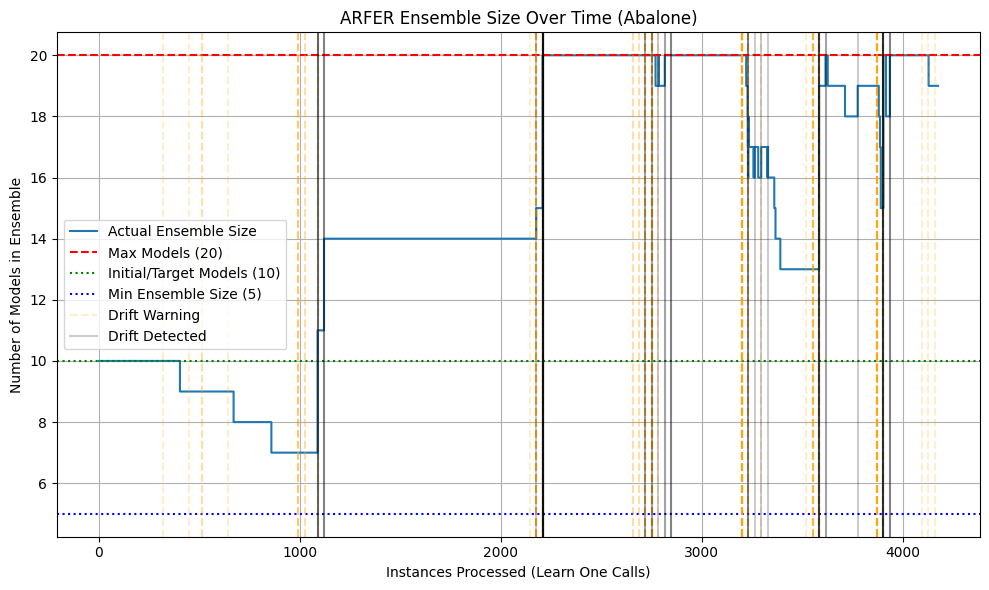

In [12]:
import matplotlib.pyplot as plt
mark_drifts = True
mark_warnings = True

model = arfer

if not model.model_count_history:
    print("No model count history to plot for ARFER.")

plt.figure(figsize=(10, 6))
plt.plot(model.model_count_history, drawstyle="steps-post", label="Actual Ensemble Size")

plt.axhline(model.max_models, color='r', linestyle='--', label=f"Max Models ({model.max_models})")
plt.axhline(model.n_models, color='g', linestyle=':', label=f"Initial/Target Models ({model.n_models})")
if model._min_number_of_models > 0:
    plt.axhline(model._min_number_of_models, color='b', linestyle=':', label=f"Min Ensemble Size ({model._min_number_of_models})")

# Add vertical drift and warning markers
if mark_warnings and hasattr(model, "warning_points"):
    for step in model.warning_points:
        plt.axvline(x=step, color='orange', linestyle='--', alpha=0.2, label='Drift Warning')
if mark_drifts and hasattr(model, "drift_points"):
    for step in model.drift_points:
        plt.axvline(x=step, color='k', linestyle='-', alpha=0.2, label='Drift Detected')

# Avoid duplicate legend labels
handles, labels = plt.gca().get_legend_handles_labels()
by_label = dict(zip(labels, handles))
plt.legend(by_label.values(), by_label.keys())

plt.xlabel("Instances Processed (Learn One Calls)")
plt.ylabel("Number of Models in Ensemble")
plt.title("ARFER Ensemble Size Over Time (Abalone)")
plt.grid(True)
plt.tight_layout()
plt.show()

In [14]:
# Rerun for more precise plots with drift detection

# abalone: arfer, dwarfer

# bikesharing: arfer, dwarfer

In [15]:
from datasets import BikeSharing
from itertools import tee

bike_stream = BikeSharing().load_stream()
bike_arfer_stream, bike_dwarfer_stream = tee(bike_stream, 2)

arfer = make_smart_arf()
dwarfer = make_smart_arf_dw()

from evaluation import evaluate_model

arfer_abalone_results = evaluate_model(
    model=arfer,
    name="ARFER",
    stream=bike_arfer_stream,
    verbose=False
)

dwarfer_abalone_results = evaluate_model(
    model=dwarfer,
    name="DWARFER",
    stream=bike_dwarfer_stream,
    verbose=False
)

[SmartARF Step 1] First learn_one. Effective n_models=10, max_models=20, min_ensemble_size=5
[SmartARF Step 1] Start learn_one. Current ensemble size: 10
[SmartARF Step 1] End learn_one. Final ensemble size: 10
[SmartARF Step 2] Start learn_one. Current ensemble size: 10
[SmartARF Step 2] End learn_one. Final ensemble size: 10
[SmartARF Step 3] Start learn_one. Current ensemble size: 10
[SmartARF Step 3] End learn_one. Final ensemble size: 10
[SmartARF Step 4] Start learn_one. Current ensemble size: 10
[SmartARF Step 4] End learn_one. Final ensemble size: 10
[SmartARF Step 5] Start learn_one. Current ensemble size: 10
[SmartARF Step 5] End learn_one. Final ensemble size: 10
[SmartARF Step 6] Start learn_one. Current ensemble size: 10
[SmartARF Step 6] End learn_one. Final ensemble size: 10
[SmartARF Step 7] Start learn_one. Current ensemble size: 10
[SmartARF Step 7] End learn_one. Final ensemble size: 10
[SmartARF Step 8] Start learn_one. Current ensemble size: 10
[SmartARF Step 8] En

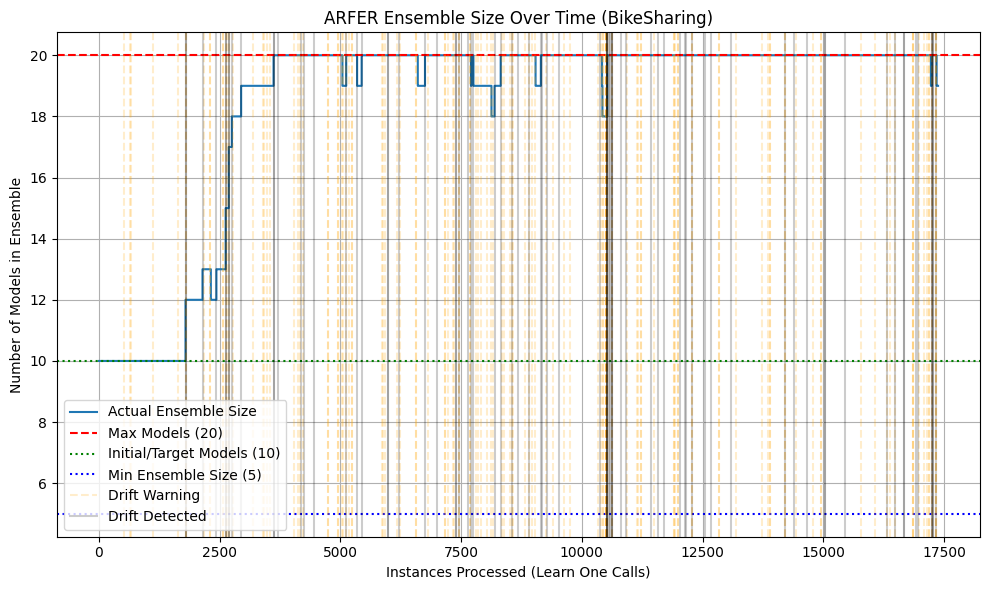

In [16]:
import matplotlib.pyplot as plt
mark_drifts = True
mark_warnings = True

model = arfer

if not model.model_count_history:
    print("No model count history to plot for ARFER.")

plt.figure(figsize=(10, 6))
plt.plot(model.model_count_history, drawstyle="steps-post", label="Actual Ensemble Size")

plt.axhline(model.max_models, color='r', linestyle='--', label=f"Max Models ({model.max_models})")
plt.axhline(model.n_models, color='g', linestyle=':', label=f"Initial/Target Models ({model.n_models})")
if model._min_number_of_models > 0:
    plt.axhline(model._min_number_of_models, color='b', linestyle=':', label=f"Min Ensemble Size ({model._min_number_of_models})")

# Add vertical drift and warning markers
if mark_warnings and hasattr(model, "warning_points"):
    for step in model.warning_points:
        plt.axvline(x=step, color='orange', linestyle='--', alpha=0.2, label='Drift Warning')
if mark_drifts and hasattr(model, "drift_points"):
    for step in model.drift_points:
        plt.axvline(x=step, color='k', linestyle='-', alpha=0.2, label='Drift Detected')

# Avoid duplicate legend labels
handles, labels = plt.gca().get_legend_handles_labels()
by_label = dict(zip(labels, handles))
plt.legend(by_label.values(), by_label.keys())

plt.xlabel("Instances Processed (Learn One Calls)")
plt.ylabel("Number of Models in Ensemble")
plt.title("ARFER Ensemble Size Over Time (BikeSharing)")
plt.grid(True)
plt.tight_layout()
plt.show()